# import Lib

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


import seaborn as sns
import matplotlib.cm as cm


from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import json
import pickle

from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer

# -----

In [112]:
sales_transactions_df = pd.read_csv('datanya.csv')
sales_transactions_df

,Employee_ID,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,Resigned
0,1,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,33,32,22,2,0,14,66,0,2.63,False
1,2,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,34,34,13,14,100,12,61,2,1.72,False
2,3,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,37,27,6,3,50,10,1,0,3.17,False
3,4,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,52,10,28,12,100,10,0,1,1.86,False
4,5,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,38,11,29,13,100,15,9,1,1.25,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99996,Finance,Male,27,Technician,2022-12-07 08:03:05.556036,1,Bachelor,4,4900.0,55,46,5,3,75,16,48,2,1.28,False
99996,99997,IT,Female,36,Consultant,2018-07-24 08:03:05.556036,6,Master,5,8250.0,39,35,7,0,0,10,77,1,3.48,True
99997,99998,Operations,Male,53,Analyst,2015-11-24 08:03:05.556036,8,High School,2,4800.0,31,13,6,5,0,5,87,1,2.60,False
99998,99999,HR,Female,22,Consultant,2015-08-03 08:03:05.556036,9,High School,5,8250.0,35,43,10,1,75,2,31,1,3.10,False


In [113]:
# Get only the transactions

sales_df = sales_transactions_df.drop(['Employee_ID','Hire_Date','Resigned','Performance_Score','Team_Size','Sick_Days','Remote_Work_Frequency'], axis=1)
sales_df

,Department,Gender,Age,Job_Title,Years_At_Company,Education_Level,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Training_Hours,Promotions,Employee_Satisfaction_Score
0,IT,Male,55,Specialist,2,High School,6750.0,33,32,22,66,0,2.63
1,Finance,Male,29,Developer,0,High School,7500.0,34,34,13,61,2,1.72
2,Finance,Male,55,Specialist,8,High School,5850.0,37,27,6,1,0,3.17
3,Customer Support,Female,48,Analyst,7,Bachelor,4800.0,52,10,28,0,1,1.86
4,Engineering,Female,36,Analyst,3,Bachelor,4800.0,38,11,29,9,1,1.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,Finance,Male,27,Technician,1,Bachelor,4900.0,55,46,5,48,2,1.28
99996,IT,Female,36,Consultant,6,Master,8250.0,39,35,7,77,1,3.48
99997,Operations,Male,53,Analyst,8,High School,4800.0,31,13,6,87,1,2.60
99998,HR,Female,22,Consultant,9,High School,8250.0,35,43,10,31,1,3.10


In [114]:
numerical_cols = sales_df.select_dtypes(include=['int64', 'float64']).columns
numerical_cols

Index(['Age', 'Years_At_Company', 'Monthly_Salary', 'Work_Hours_Per_Week',
       'Projects_Handled', 'Overtime_Hours', 'Training_Hours', 'Promotions',
       'Employee_Satisfaction_Score'],
      dtype='object')

In [115]:
# Feature scaling
scaler = StandardScaler()
sales_scaled = scaler.fit_transform(sales_df[numerical_cols])

# Dimensionality Reduction using PCA
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(sales_scaled)

PCA()

Text(0, 0.5, 'Eigenvalues')

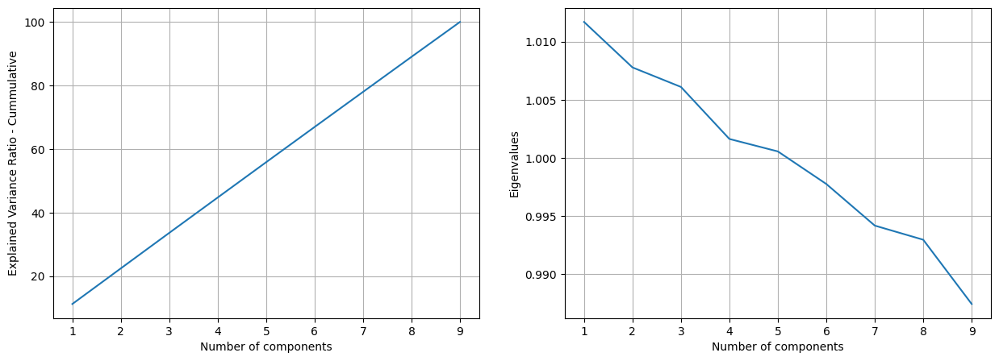

In [117]:
# Plot the Cummulative of Explained Variance Ratio
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(range(1, 10), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained Variance Ratio - Cummulative')

# Plot the Eigenvalues
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(range(1, 10), pca.explained_variance_ )
plt.xlabel('Number of components')
plt.ylabel('Eigenvalues')

In [118]:
# Check the number of features if we want to retain 95 % of the information

cumsum = np.cumsum(pca.explained_variance_ratio_)
num_features = np.argmax(cumsum >= 0.95) + 1
num_features

9

In [119]:
# Let's train the model with 95 % of the original dataset information

pca = PCA(n_components=0.95)
pca.fit(sales_scaled)

sales_scaled_pca = pca.transform(sales_scaled)

In [120]:
# Train with optimal number of clusters

km = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 42)
pred = km.fit_predict(sales_scaled_pca)
pred

array([2, 0, 3, ..., 4, 0, 0])

In [121]:
# Insert clustering result into original dataset

sales_transactions_df['cluster'] = pred
sales_transactions_df

,Employee_ID,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,...,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,Resigned,cluster
0,1,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,...,32,22,2,0,14,66,0,2.63,False,2
1,2,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,...,34,13,14,100,12,61,2,1.72,False,0
2,3,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,...,27,6,3,50,10,1,0,3.17,False,3
3,4,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,...,10,28,12,100,10,0,1,1.86,False,1
4,5,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,...,11,29,13,100,15,9,1,1.25,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99996,Finance,Male,27,Technician,2022-12-07 08:03:05.556036,1,Bachelor,4,4900.0,...,46,5,3,75,16,48,2,1.28,False,0
99996,99997,IT,Female,36,Consultant,2018-07-24 08:03:05.556036,6,Master,5,8250.0,...,35,7,0,0,10,77,1,3.48,True,0
99997,99998,Operations,Male,53,Analyst,2015-11-24 08:03:05.556036,8,High School,2,4800.0,...,13,6,5,0,5,87,1,2.60,False,4
99998,99999,HR,Female,22,Consultant,2015-08-03 08:03:05.556036,9,High School,5,8250.0,...,43,10,1,75,2,31,1,3.10,False,0


<Axes: >

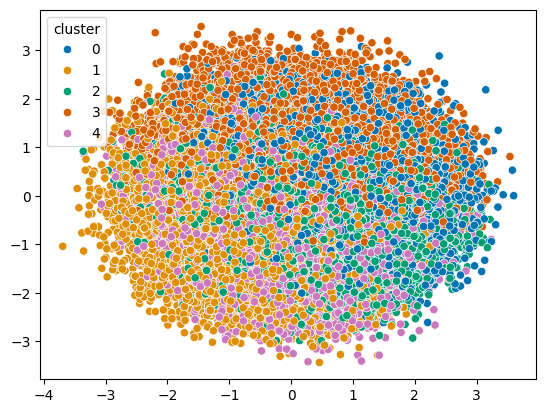

In [122]:
# Cluster visualization in 2D

pca_2d = PCA(n_components=2)
pca_2d.fit(sales_scaled)

sales_scaled_pca_2d = pca_2d.fit_transform(sales_scaled)

sns.scatterplot(x=sales_scaled_pca_2d[:,0], y=sales_scaled_pca_2d[:,1], hue=sales_transactions_df['cluster'], palette='colorblind')

In [162]:
import pandas as pd

# Select relevant features for clustering
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

employee_data = pd.read_csv('datanya.csv')
# Select relevant features for clustering
features = [
    "Performance_Score",
    "Projects_Handled",
    "Overtime_Hours",
    "Sick_Days",
    "Employee_Satisfaction_Score",
]
data = employee_data[features]

# Standardize the features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Perform clustering with 4 clusters
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
clusters = kmeans.fit_predict(data_scaled)

# Add the cluster labels to the original dataset
employee_data["Cluster"] = clusters

# Map clusters to performance categories based on feature analysis
# (Mapping may be adjusted after examining feature means for each cluster.)
cluster_means = employee_data.groupby("Cluster")[features].mean()
categories = {0: "Good performers", 1: "Satisfactory performers", 2: "Needs improvement", 3: "Should be terminated"}
employee_data["Performance_Category"] = employee_data["Cluster"].map(categories)

# Display cluster means for manual adjustment of mapping (if necessary)
cluster_means


,Performance_Score,Projects_Handled,Overtime_Hours,Sick_Days,Employee_Satisfaction_Score
Cluster,,,,,
0,4.207356,29.161618,14.219030,3.250981,2.411455
1,3.904274,12.747195,14.820532,8.809568,3.918993
2,3.024118,38.181249,14.760082,11.118067,2.887566
3,2.084457,12.697782,14.056937,7.975976,2.013868
4,1.775755,28.788577,14.716376,3.755945,3.786728


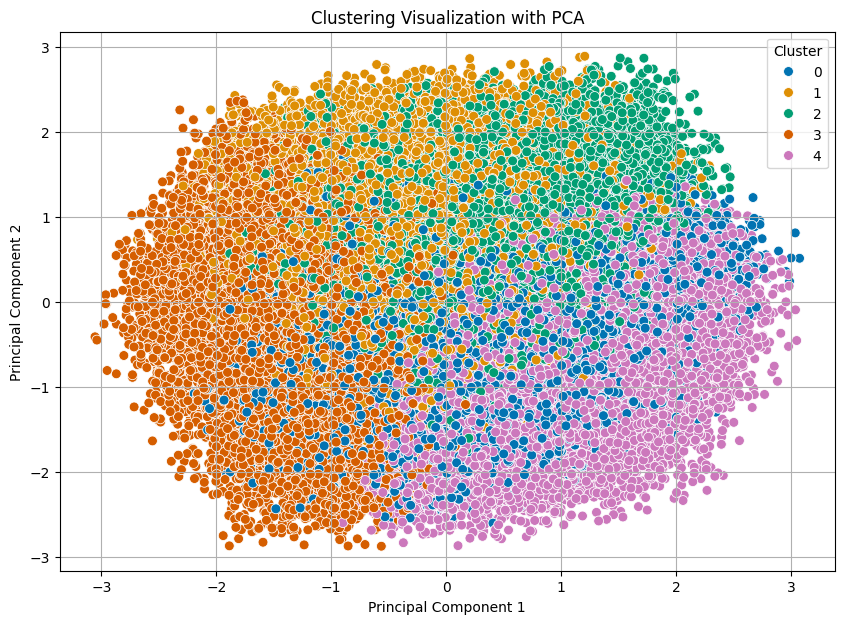

In [163]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Reduce dimensions for visualization using PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)

# Create a DataFrame for visualization
visualization_data = pd.DataFrame(data_pca, columns=["PC1", "PC2"])
visualization_data["Cluster"] = clusters

# Plot the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x="PC1",
    y="PC2",
    hue="Cluster",
    palette="colorblind",
    data=visualization_data,
    s=50
)
plt.title("Clustering Visualization with PCA")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster", loc="best")
plt.grid(True)
plt.show()

# ------

In [164]:
data = pd.read_csv('datanya.csv')

# Menampilkan informasi awal tentang dataset
data.info(), data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 20 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Employee_ID                  100000 non-null  int64  
 1   Department                   100000 non-null  object 
 2   Gender                       100000 non-null  object 
 3   Age                          100000 non-null  int64  
 4   Job_Title                    100000 non-null  object 
 5   Hire_Date                    100000 non-null  object 
 6   Years_At_Company             100000 non-null  int64  
 7   Education_Level              100000 non-null  object 
 8   Performance_Score            100000 non-null  int64  
 9   Monthly_Salary               100000 non-null  float64
 10  Work_Hours_Per_Week          100000 non-null  int64  
 11  Projects_Handled             100000 non-null  int64  
 12  Overtime_Hours               100000 non-null  int64  
 13  

(None,
    Employee_ID        Department  Gender  Age   Job_Title  \
 0            1                IT    Male   55  Specialist   
 1            2           Finance    Male   29   Developer   
 2            3           Finance    Male   55  Specialist   
 3            4  Customer Support  Female   48     Analyst   
 4            5       Engineering  Female   36     Analyst   
 
                     Hire_Date  Years_At_Company Education_Level  \
 0  2022-01-19 08:03:05.556036                 2     High School   
 1  2024-04-18 08:03:05.556036                 0     High School   
 2  2015-10-26 08:03:05.556036                 8     High School   
 3  2016-10-22 08:03:05.556036                 7        Bachelor   
 4  2021-07-23 08:03:05.556036                 3        Bachelor   
 
    Performance_Score  Monthly_Salary  Work_Hours_Per_Week  Projects_Handled  \
 0                  5          6750.0                   33                32   
 1                  5          7500.0            

In [ ]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Menghapus kolom yang tidak relevan untuk clustering
irrelevant_columns = ['Employee_ID', 'Hire_Date', 'Job_Title']
data_cleaned = data.drop(columns=irrelevant_columns)

# Encoding categorical variables
categorical_columns = ['Department', 'Gender', 'Education_Level']
label_encoders = {col: LabelEncoder() for col in categorical_columns}
for col in categorical_columns:
    data_cleaned[col] = label_encoders[col].fit_transform(data_cleaned[col])

# Standarisasi data numerik
scaler = StandardScaler()
numerical_columns = [
    'Age', 'Years_At_Company', 'Performance_Score', 'Monthly_Salary',
    'Work_Hours_Per_Week', 'Projects_Handled', 'Overtime_Hours',
    'Sick_Days', 'Remote_Work_Frequency', 'Team_Size', 'Training_Hours',
    'Promotions', 'Employee_Satisfaction_Score'
]
data_cleaned[numerical_columns] = scaler.fit_transform(data_cleaned[numerical_columns])

# Menampilkan data yang telah diproses
data_cleaned.head()


,Department,Gender,Age,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,Resigned
0,4,1,1.242486,-0.862946,1,1.416939,0.252669,-1.337174,0.523088,0.863929,-1.156290,-1.416948,0.725417,0.570917,-1.225346,-0.320747,False
1,2,1,-1.069845,-1.559975,1,1.416939,0.799117,-1.225341,0.661310,-0.174854,1.614068,1.411828,0.361475,0.397849,1.226032,-1.111561,False
2,2,1,1.242486,1.228140,1,0.003230,-0.403068,-0.889844,0.177534,-0.982796,-0.925427,-0.002560,-0.002468,-1.678977,-1.225346,0.148527,False
3,0,0,0.619935,0.879626,0,-0.703624,-1.168094,0.787641,-0.997350,1.556452,1.152342,1.411828,-0.002468,-1.713591,0.000343,-0.989897,False
4,1,0,-0.447295,-0.514432,0,-0.703624,-1.168094,-0.778012,-0.928239,1.671872,1.383205,1.411828,0.907388,-1.402067,0.000343,-1.520003,False


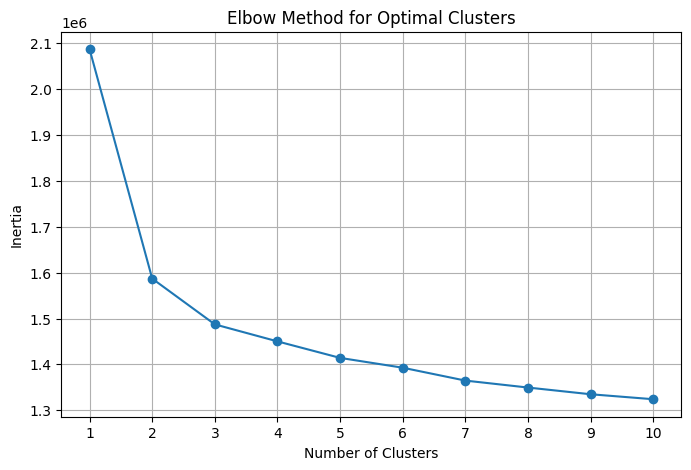

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Mencari jumlah cluster optimal dengan Elbow Method
inertia = []
k_range = range(1, 11)  # Memeriksa hingga 10 cluster

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_cleaned)
    inertia.append(kmeans.inertia_)

# Plot Elbow Method
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(k_range)
plt.grid(True)
plt.show()


In [ ]:
# Train with optimal number of clusters

km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)
pred = km.fit_predict(data_cleaned)
pred

array([3, 3, 1, ..., 0, 3, 1])

In [168]:
# Insert clustering result into original dataset

data_cleaned['cluster'] = pred
data_cleaned

,Department,Gender,Age,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,Resigned,cluster
0,4,1,1.242486,-0.862946,1,1.416939,0.252669,-1.337174,0.523088,0.863929,-1.156290,-1.416948,0.725417,0.570917,-1.225346,-0.320747,False,3
1,2,1,-1.069845,-1.559975,1,1.416939,0.799117,-1.225341,0.661310,-0.174854,1.614068,1.411828,0.361475,0.397849,1.226032,-1.111561,False,3
2,2,1,1.242486,1.228140,1,0.003230,-0.403068,-0.889844,0.177534,-0.982796,-0.925427,-0.002560,-0.002468,-1.678977,-1.225346,0.148527,False,1
3,0,0,0.619935,0.879626,0,-0.703624,-1.168094,0.787641,-0.997350,1.556452,1.152342,1.411828,-0.002468,-1.713591,0.000343,-0.989897,False,1
4,1,0,-0.447295,-0.514432,0,-0.703624,-1.168094,-0.778012,-0.928239,1.671872,1.383205,1.411828,0.907388,-1.402067,0.000343,-1.520003,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,2,1,-1.247717,-1.211461,0,0.710085,-1.095234,1.123138,1.490640,-1.098217,-0.925427,0.704634,1.089359,-0.052130,1.226032,-1.493932,False,1
99996,4,0,-0.447295,0.531112,2,1.416939,1.345564,-0.666180,0.730421,-0.867376,-1.618016,-1.416948,-0.002468,0.951669,0.000343,0.417925,True,3
99997,7,1,1.064614,1.228140,1,-0.703624,-1.168094,-1.560838,-0.790018,-0.982796,-0.463700,-1.416948,-0.912323,1.297807,0.000343,-0.346818,False,0
99998,3,0,-1.692396,1.576655,1,1.416939,1.345564,-1.113509,1.283307,-0.521115,-1.387153,0.704634,-1.458236,-0.640564,0.000343,0.087695,False,3


<Axes: >

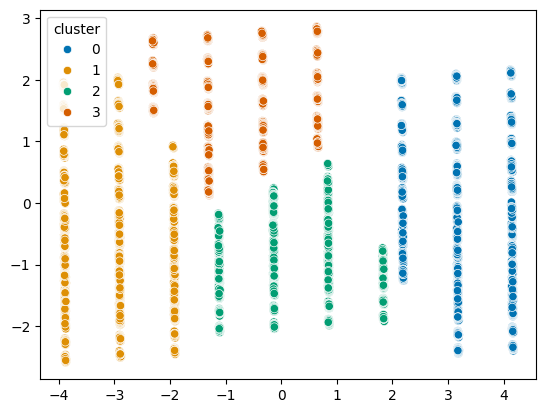

In [ ]:
# Cluster visualization in 2D

pca_2d = PCA(n_components=2)
pca_2d.fit(data_cleaned)

sales_scaled_pca_2d = pca_2d.fit_transform(data_cleaned)

sns.scatterplot(x=sales_scaled_pca_2d[:,0], y=sales_scaled_pca_2d[:,1], hue=data_cleaned['cluster'], palette='colorblind')

# ---- Kmeans

In [2]:
data1 = pd.read_csv('data_selected.csv')
data1.head(10)

,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score
0,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,33,32,22,2,0,14,66,0,2.63
1,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,34,34,13,14,100,12,61,2,1.72
2,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,37,27,6,3,50,10,1,0,3.17
3,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,52,10,28,12,100,10,0,1,1.86
4,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,38,11,29,13,100,15,9,1,1.25
5,IT,Male,43,Manager,2016-08-14 08:03:05.556036,8,High School,3,7800.0,46,31,8,0,100,15,95,0,2.77
6,IT,Male,37,Technician,2023-08-28 08:03:05.556036,1,Bachelor,5,5250.0,55,20,29,2,0,16,27,0,4.46
7,Engineering,Female,55,Engineer,2014-10-27 08:03:05.556036,9,Bachelor,2,7200.0,42,46,7,8,100,7,64,0,2.09
8,Marketing,Female,55,Technician,2023-06-29 08:03:05.556036,1,High School,2,4200.0,51,23,21,14,0,1,0,1,1.44
9,Engineering,Female,45,Consultant,2016-12-23 08:03:05.556036,7,Bachelor,1,6050.0,41,33,2,6,75,4,53,2,2.93


In [3]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89990 entries, 0 to 89989
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Department                   89990 non-null  object 
 1   Gender                       89990 non-null  object 
 2   Age                          89990 non-null  int64  
 3   Job_Title                    89990 non-null  object 
 4   Hire_Date                    89990 non-null  object 
 5   Years_At_Company             89990 non-null  int64  
 6   Education_Level              89990 non-null  object 
 7   Performance_Score            89990 non-null  int64  
 8   Monthly_Salary               89990 non-null  float64
 9   Work_Hours_Per_Week          89990 non-null  int64  
 10  Projects_Handled             89990 non-null  int64  
 11  Overtime_Hours               89990 non-null  int64  
 12  Sick_Days                    89990 non-null  int64  
 13  Remote_Work_Freq

In [4]:
data = data1.drop(['Department','Gender','Job_Title','Hire_Date','Education_Level'], axis=1)

In [5]:
num_columns = data.select_dtypes(include=['int64', 'float64']).columns
data_num_columns = data[num_columns]
data_num_columns

,Age,Years_At_Company,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score
0,55,2,5,6750.0,33,32,22,2,0,14,66,0,2.63
1,29,0,5,7500.0,34,34,13,14,100,12,61,2,1.72
2,55,8,3,5850.0,37,27,6,3,50,10,1,0,3.17
3,48,7,2,4800.0,52,10,28,12,100,10,0,1,1.86
4,36,3,2,4800.0,38,11,29,13,100,15,9,1,1.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...
89985,56,0,1,6600.0,57,29,27,14,75,5,22,1,4.01
89986,27,1,4,4900.0,55,46,5,3,75,16,48,2,1.28
89987,53,8,2,4800.0,31,13,6,5,0,5,87,1,2.60
89988,22,9,5,8250.0,35,43,10,1,75,2,31,1,3.10


In [6]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

In [7]:
pca = PCA()
pca.fit(data_scaled)


PCA()

Text(0, 0.5, 'Eigenvalues')

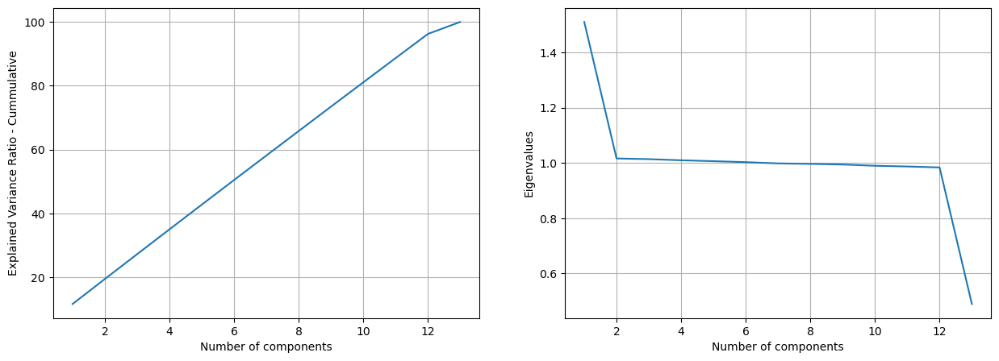

In [8]:
# Plot the Cummulative of Explained Variance Ratio
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(range(1, 14), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained Variance Ratio - Cummulative')

# Plot the Eigenvalues
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(range(1, 14), pca.explained_variance_ )
plt.xlabel('Number of components')
plt.ylabel('Eigenvalues')

In [9]:
# Check the number of features if we want to retain 75 % of the information

cumsum = np.cumsum(pca.explained_variance_ratio_)
num_features = np.argmax(cumsum >= 0.95) + 1
num_features

12

In [10]:
# Let's train the model with 95 % of the original dataset information

pca = PCA(n_components=0.95)
pca.fit(data_scaled)

data_scaled_pca = pca.transform(data_scaled)

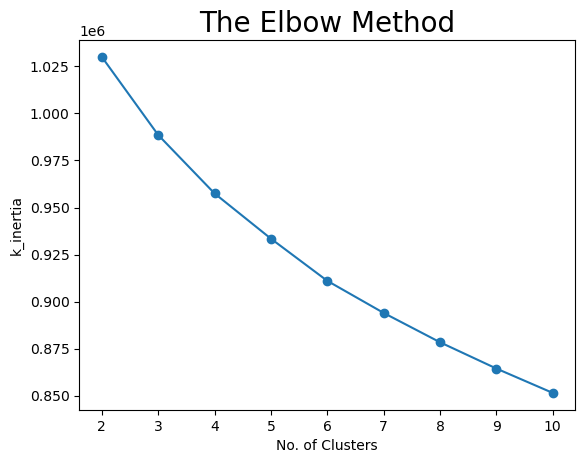

In [11]:
k_inertia = []
#membuat iterasi dari 2-10 untuk nilai k terbaik
for i in range(2, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 3)
    km.fit(data_scaled_pca)
    k_inertia.append(km.inertia_)

plt.plot(range(2, 11), k_inertia, marker ="o")
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('k_inertia')
plt.show()

In [12]:
# Function to create Silhouette Plot

import matplotlib.cm as cm
from sklearn.metrics import silhouette_score,silhouette_samples

def plot_silhouette(range_n_clusters, X, random_state):
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 4)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_

        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

In [13]:
# Display the Silhouette Score and Plot Silhouette Plot

# plot_silhouette(range(2, 6), data_scaled_pca, 3)

3

In [14]:
km = KMeans(n_clusters = 4, random_state = 3)
km.fit(data_scaled_pca)

KMeans(n_clusters=4, random_state=3)

In [15]:
pred = km.predict(data_scaled_pca)
pred

array([0, 0, 2, ..., 2, 0, 3])

In [16]:
# Insert clustering result into original dataset

data1['cluster'] = pred
data1

,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,cluster
0,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,33,32,22,2,0,14,66,0,2.63,0
1,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,34,34,13,14,100,12,61,2,1.72,0
2,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,37,27,6,3,50,10,1,0,3.17,2
3,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,52,10,28,12,100,10,0,1,1.86,3
4,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,38,11,29,13,100,15,9,1,1.25,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89985,IT,Female,56,Engineer,2024-07-04 08:03:05.556036,0,Bachelor,1,6600.0,57,29,27,14,75,5,22,1,4.01,3
89986,Finance,Male,27,Technician,2022-12-07 08:03:05.556036,1,Bachelor,4,4900.0,55,46,5,3,75,16,48,2,1.28,2
89987,Operations,Male,53,Analyst,2015-11-24 08:03:05.556036,8,High School,2,4800.0,31,13,6,5,0,5,87,1,2.60,2
89988,HR,Female,22,Consultant,2015-08-03 08:03:05.556036,9,High School,5,8250.0,35,43,10,1,75,2,31,1,3.10,0


In [22]:
# data1.to_csv('cluster_kmeans.csv',index=False)

<Axes: >

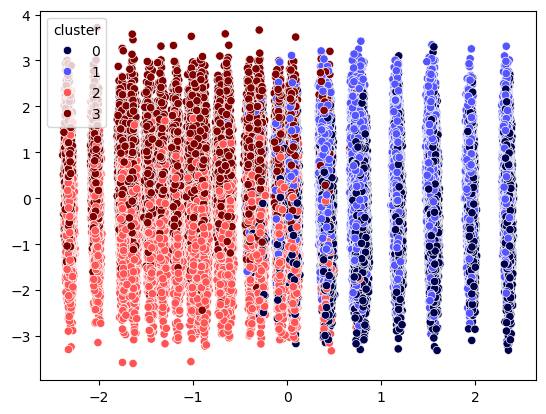

In [17]:
# Cluster visualization in 2D

pca_2d = PCA(n_components=2)
pca_2d.fit(data_scaled)

sales_scaled_pca_2d = pca_2d.fit_transform(data_scaled)

sns.scatterplot(x=sales_scaled_pca_2d[:,0], y=sales_scaled_pca_2d[:,1], hue=data1['cluster'], palette='seismic')

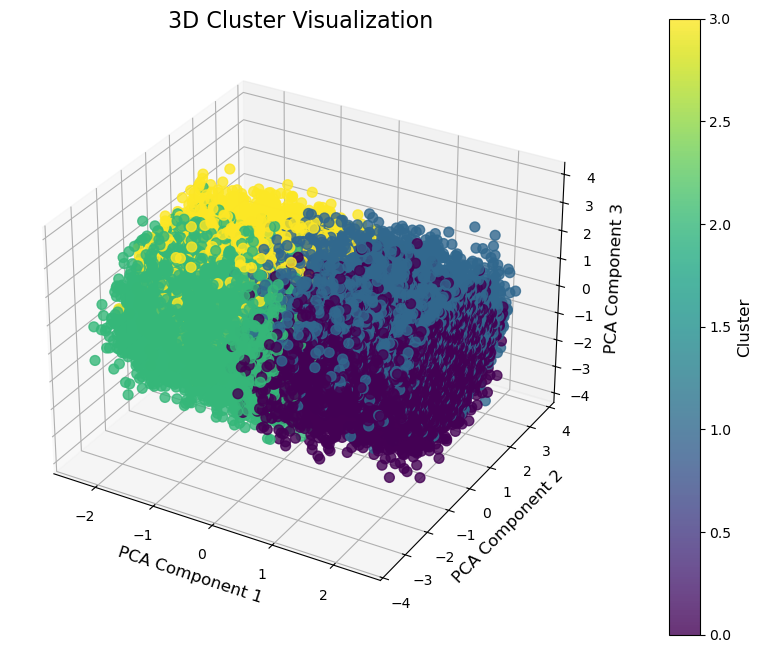

In [18]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Menggunakan PCA untuk mereduksi dimensi menjadi 3
pca_3d = PCA(n_components=3)
sales_scaled_pca_3d = pca_3d.fit_transform(data_scaled)

# Visualisasi scatter plot 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(
    sales_scaled_pca_3d[:, 0], 
    sales_scaled_pca_3d[:, 1], 
    sales_scaled_pca_3d[:, 2], 
    c=data1['cluster'], 
    cmap='viridis', 
    s=50, 
    alpha=0.8
)

# Menambahkan label untuk sumbu
ax.set_title('3D Cluster Visualization', fontsize=16)
ax.set_xlabel('PCA Component 1', fontsize=12)
ax.set_ylabel('PCA Component 2', fontsize=12)
ax.set_zlabel('PCA Component 3', fontsize=12)

# Menambahkan color bar
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Cluster', fontsize=12)

plt.show()


In [19]:
import plotly.express as px
from sklearn.decomposition import PCA
import pandas as pd

# Melakukan PCA dengan 3 komponen
pca_3d = PCA(n_components=3)
sales_scaled_pca_3d = pca_3d.fit_transform(data_scaled)

# Membuat DataFrame hasil PCA
pca_df = pd.DataFrame(sales_scaled_pca_3d, columns=['PCA1', 'PCA2', 'PCA3'])
pca_df['Cluster'] = data1['cluster']

# Membuat scatter plot 3D interaktif
fig = px.scatter_3d(
    pca_df, 
    x='PCA1', 
    y='PCA2', 
    z='PCA3', 
    color='Cluster', 
    color_continuous_scale='Viridis',  # Ubah ke palet lain jika diinginkan
    title='3D Cluster Visualization',
    labels={'Cluster': 'Cluster Group'}
)

# Menambahkan pengaturan tampilan
fig.update_traces(marker=dict(size=5, opacity=0.8))
fig.update_layout(
    scene=dict(
        xaxis_title='PCA Component 1',
        yaxis_title='PCA Component 2',
        zaxis_title='PCA Component 3'
    )
)

# Menampilkan plot
fig.show()


In [20]:
# Save the trained KMeans model
with open('kmeans_model.pkl', 'wb') as f:
  pickle.dump(km, f)

# Save the StandardScaler
with open('scaler.pkl', 'wb') as f:
  pickle.dump(scaler, f)

# Save the PCA model
with open('pca.pkl', 'wb') as f:
  pickle.dump(pca, f)

# Kproto 2

In [91]:
import pandas as pd
from kmodes.kprototypes import KPrototypes
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

In [92]:
data1 = pd.read_csv('data_clean.csv')

In [93]:
proto = data1.copy()
proto = proto.drop(['Hire_Date','Resigned','Employee_ID','Department','Gender','Job_Title'], axis=1)

In [94]:
num_columns = proto.select_dtypes(include = np.number).columns.tolist()
cat_columns = proto.select_dtypes(include = ['object']).columns.tolist()

In [95]:
proto_num = proto[num_columns]
proto_cat = proto[cat_columns]

print('Num Columns : ', num_columns)
print('Cat Columns : ', cat_columns)

Num Columns :  ['Age', 'Years_At_Company', 'Performance_Score', 'Monthly_Salary', 'Work_Hours_Per_Week', 'Projects_Handled', 'Overtime_Hours', 'Sick_Days', 'Remote_Work_Frequency', 'Team_Size', 'Training_Hours', 'Promotions', 'Employee_Satisfaction_Score']
Cat Columns :  ['Education_Level']


In [96]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(proto_num)

Text(0, 0.5, 'Eigenvalues')

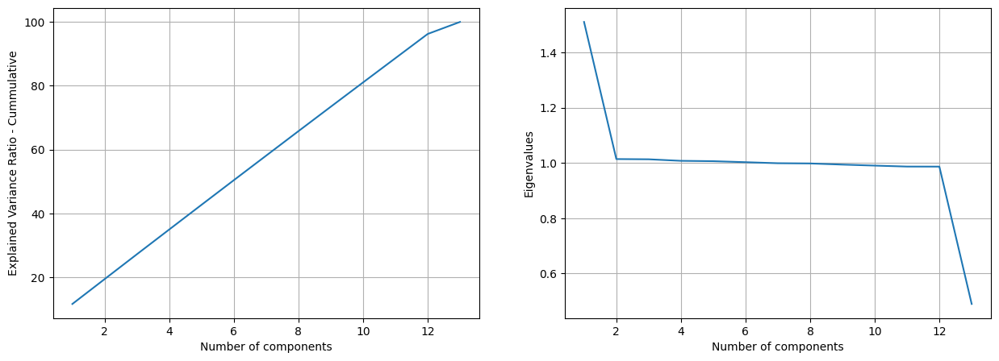

In [97]:
# Dimensionality Reduction using PCA
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(data_scaled)

# Plot the Cummulative of Explained Variance Ratio
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(range(1, 14), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained Variance Ratio - Cummulative')

# Plot the Eigenvalues
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(range(1, 14), pca.explained_variance_ )
plt.xlabel('Number of components')
plt.ylabel('Eigenvalues')

In [98]:
# Check the number of features if we want to retain 95 % of the information

cumsum = np.cumsum(pca.explained_variance_ratio_)
num_features = np.argmax(cumsum >= 0.70) + 1
num_features

9

In [99]:
# Let's train the model with 95 % of the original dataset information

pca = PCA(n_components=9)
pca.fit(data_scaled)

proto_num_scaled_pca = pca.transform(data_scaled)

In [100]:
# Concate columns

proto_df_final = np.concatenate([proto_num_scaled_pca, proto_cat], axis=1)
proto_df_final = pd.DataFrame(proto_df_final, columns=[['PCA1', 'PCA2', 'PCA3', 'PCA4','PCA5','PCA6','PCA7','PCA8','PCA9'] + cat_columns])
proto_df_final = proto_df_final.infer_objects()
proto_df_final

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,Education_Level
0,1.189447,0.563717,0.906726,-1.064547,0.695692,0.935619,0.790629,0.310702,0.591383,High School
1,1.575399,-1.097924,-1.287782,-1.366460,-0.796941,-1.717398,0.000079,1.045166,1.631879,High School
2,-0.259470,-0.170450,-0.209527,-0.337523,0.910513,2.628200,-0.100004,0.521897,-0.795163,High School
3,-1.328077,-0.735473,1.386064,0.500126,-0.918682,0.029316,-1.165547,0.624262,0.815264,Bachelor
4,-1.321879,-1.053227,0.493071,-0.353486,-0.934710,-0.713933,-1.261243,1.910536,1.845980,Bachelor
...,...,...,...,...,...,...,...,...,...,...
99995,-0.315710,0.739968,-2.111049,0.763234,-0.636692,-0.950763,-0.010826,0.592176,0.838687,Bachelor
99996,1.947765,1.271933,-0.983438,0.215375,0.490921,1.028839,1.121073,-0.482422,-0.390000,Master
99997,-1.293584,-0.659861,0.227619,-0.268561,-0.579075,1.890692,1.957974,-0.592009,-0.599984,High School
99998,1.949818,1.001110,-2.260983,-0.057575,0.354695,1.776505,-0.609434,-0.977283,0.890887,High School


In [101]:
# Get the position of categorical columns

index_cat_columns = [proto_df_final.columns.get_loc(col) for col in list(proto_df_final.select_dtypes('object').columns)]

print('Categorical columns        : ', cat_columns)
print('Categorical columns index  : ', index_cat_columns)

Categorical columns        :  ['Education_Level']
Categorical columns index  :  [9]


Cluster creation :  2
Cluster creation :  3
Cluster creation :  4
Cluster creation :  5


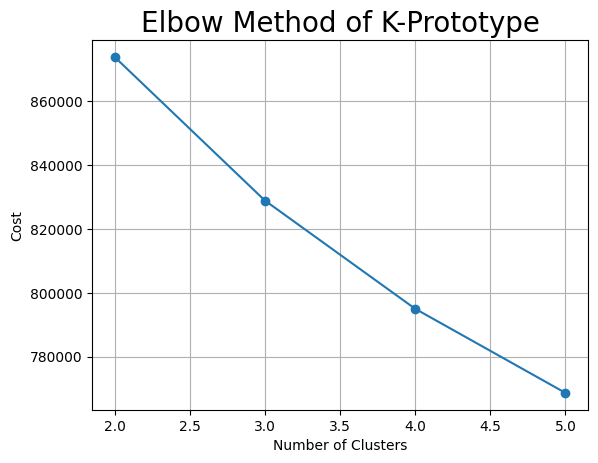

In [102]:
# Find the optimal number of clusters using Elbow Method
# %%time
from kmodes.kprototypes import KPrototypes

max_clusters = 5
cost = []
for k in range(2, max_clusters+1):
  kproto = KPrototypes(n_clusters=k, init='Huang', random_state=42, n_jobs=-1)
  kproto.fit_predict(proto_df_final, categorical=index_cat_columns)
  cost.append(kproto.cost_)
  print('Cluster creation : ', k)

plt.plot(range(2, max_clusters+1), cost, marker ="o")
plt.grid()
plt.title('Elbow Method of K-Prototype', fontsize = 20)
plt.xlabel('Number of Clusters')
plt.ylabel('Cost')
plt.show()

In [103]:
# Train with optimal number of clusters

# %%time
kp = KPrototypes(n_clusters=4, random_state=42)
pred = kp.fit_predict(proto_df_final, categorical=index_cat_columns)
pred

array([0, 2, 0, ..., 1, 0, 3], dtype=uint16)

In [104]:
# Insert clustering result into original dataset

data1['cluster'] = pred
data1

,Employee_ID,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,...,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,Resigned,cluster
0,1,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,...,32,22,2,0,14,66,0,2.63,False,0
1,2,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,...,34,13,14,100,12,61,2,1.72,False,2
2,3,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,...,27,6,3,50,10,1,0,3.17,False,0
3,4,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,...,10,28,12,100,10,0,1,1.86,False,1
4,5,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,...,11,29,13,100,15,9,1,1.25,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99996,Finance,Male,27,Technician,2022-12-07 08:03:05.556036,1,Bachelor,4,4900.0,...,46,5,3,75,16,48,2,1.28,False,1
99996,99997,IT,Female,36,Consultant,2018-07-24 08:03:05.556036,6,Master,5,8250.0,...,35,7,0,0,10,77,1,3.48,True,2
99997,99998,Operations,Male,53,Analyst,2015-11-24 08:03:05.556036,8,High School,2,4800.0,...,13,6,5,0,5,87,1,2.60,False,1
99998,99999,HR,Female,22,Consultant,2015-08-03 08:03:05.556036,9,High School,5,8250.0,...,43,10,1,75,2,31,1,3.10,False,0


<Axes: >

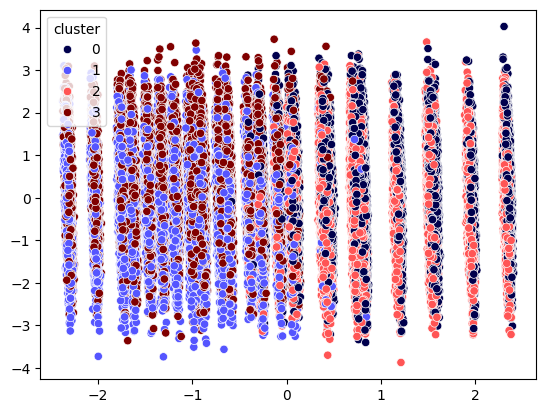

In [105]:
# Cluster visualization in 2D

pca_2d = PCA(n_components=2)
pca_2d.fit(data_scaled)

sales_scaled_pca_2d = pca_2d.fit_transform(data_scaled)

sns.scatterplot(x=sales_scaled_pca_2d[:,0], y=sales_scaled_pca_2d[:,1], hue=data1['cluster'], palette='seismic')

# By Title

In [2]:
data1 = pd.read_csv('technician.csv')
data1.head(10)

,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score
0,IT,Male,37,Technician,2023-08-28 08:03:05.556036,1,Bachelor,5,5250.0,55,20,29,2,0,16,27,0,4.46
1,Marketing,Female,55,Technician,2023-06-29 08:03:05.556036,1,High School,2,4200.0,51,23,21,14,0,1,0,1,1.44
2,Customer Support,Male,27,Technician,2015-02-19 08:03:05.556036,9,Bachelor,5,5250.0,39,13,2,13,25,5,88,0,1.96
3,HR,Male,51,Technician,2019-07-04 08:03:05.556036,5,Bachelor,4,4900.0,31,11,16,1,75,7,17,2,2.13
4,Finance,Male,23,Technician,2015-05-08 08:03:05.556036,9,High School,2,4200.0,52,0,9,1,0,5,66,0,3.91
5,HR,Male,32,Technician,2021-04-03 08:03:05.556036,3,Bachelor,4,4900.0,41,19,26,1,75,5,21,2,1.27
6,Engineering,Female,37,Technician,2015-10-24 08:03:05.556036,8,High School,2,4200.0,50,22,0,8,100,1,92,1,1.10
7,Legal,Male,37,Technician,2024-07-16 08:03:05.556036,0,Bachelor,4,4900.0,54,32,4,3,25,2,12,1,2.13
8,Customer Support,Male,31,Technician,2017-05-24 08:03:05.556036,7,PhD,3,4550.0,32,46,19,0,50,19,82,0,3.20
9,Marketing,Male,55,Technician,2019-11-14 08:03:05.556036,4,PhD,3,4550.0,59,1,9,1,25,17,59,2,1.77


In [3]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12856 entries, 0 to 12855
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Department                   12856 non-null  object 
 1   Gender                       12856 non-null  object 
 2   Age                          12856 non-null  int64  
 3   Job_Title                    12856 non-null  object 
 4   Hire_Date                    12856 non-null  object 
 5   Years_At_Company             12856 non-null  int64  
 6   Education_Level              12856 non-null  object 
 7   Performance_Score            12856 non-null  int64  
 8   Monthly_Salary               12856 non-null  float64
 9   Work_Hours_Per_Week          12856 non-null  int64  
 10  Projects_Handled             12856 non-null  int64  
 11  Overtime_Hours               12856 non-null  int64  
 12  Sick_Days                    12856 non-null  int64  
 13  Remote_Work_Freq

In [4]:
data = data1.drop(['Department','Gender','Job_Title','Hire_Date','Education_Level'], axis=1)

In [5]:
num_columns = data.select_dtypes(include=['int64', 'float64']).columns
data_num_columns = data[num_columns]
data_num_columns

,Age,Years_At_Company,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score
0,37,1,5,5250.0,55,20,29,2,0,16,27,0,4.46
1,55,1,2,4200.0,51,23,21,14,0,1,0,1,1.44
2,27,9,5,5250.0,39,13,2,13,25,5,88,0,1.96
3,51,5,4,4900.0,31,11,16,1,75,7,17,2,2.13
4,23,9,2,4200.0,52,0,9,1,0,5,66,0,3.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12851,51,4,3,4550.0,40,14,1,12,100,10,61,0,4.73
12852,41,1,5,5250.0,40,6,29,8,75,11,88,0,2.44
12853,28,0,4,4900.0,37,43,8,12,75,1,46,1,4.48
12854,41,0,2,4200.0,43,12,17,10,75,13,37,2,3.05


In [6]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

In [7]:
pca = PCA()
pca.fit(data_scaled)


PCA()

Text(0, 0.5, 'Eigenvalues')

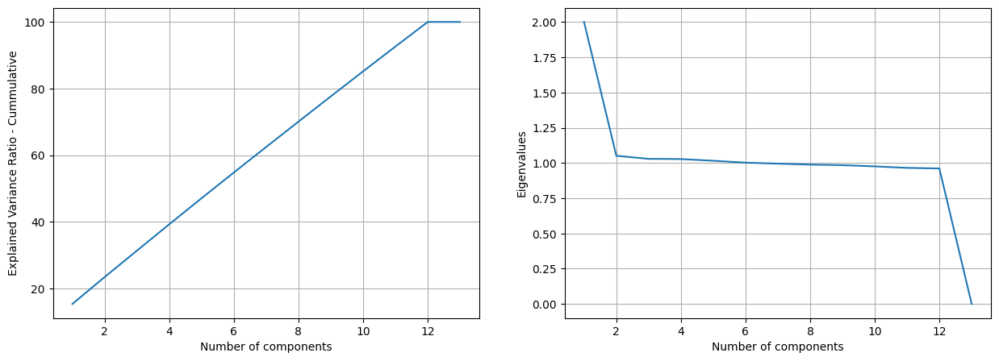

In [8]:
# Plot the Cummulative of Explained Variance Ratio
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(range(1, 14), np.cumsum(pca.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained Variance Ratio - Cummulative')

# Plot the Eigenvalues
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(range(1, 14), pca.explained_variance_ )
plt.xlabel('Number of components')
plt.ylabel('Eigenvalues')

In [9]:
# Check the number of features if we want to retain 75 % of the information

cumsum = np.cumsum(pca.explained_variance_ratio_)
num_features = np.argmax(cumsum >= 0.95) + 1
num_features

12

In [10]:
# Let's train the model with 95 % of the original dataset information

pca = PCA(n_components=0.95)
pca.fit(data_scaled)

data_scaled_pca = pca.transform(data_scaled)

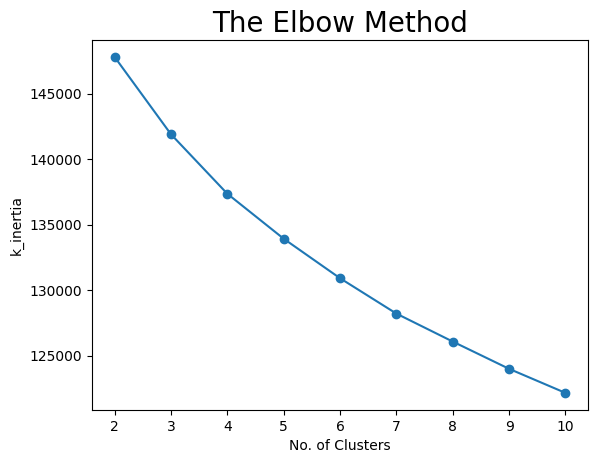

In [11]:
k_inertia = []
#membuat iterasi dari 2-10 untuk nilai k terbaik
for i in range(2, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 3)
    km.fit(data_scaled_pca)
    k_inertia.append(km.inertia_)

plt.plot(range(2, 11), k_inertia, marker ="o")
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('k_inertia')
plt.show()

In [12]:
# Function to create Silhouette Plot

import matplotlib.cm as cm
from sklearn.metrics import silhouette_score,silhouette_samples

def plot_silhouette(range_n_clusters, X, random_state):
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 4)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters = n_clusters, init = 'k-means++', max_iter = 300, n_init = 10, random_state = random_state)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_

        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

For n_clusters = 2 The average silhouette_score is : 0.11107689965254139
For n_clusters = 3 The average silhouette_score is : 0.07556913021019498
For n_clusters = 4 The average silhouette_score is : 0.06115301550895898
For n_clusters = 5 The average silhouette_score is : 0.057179591822137735


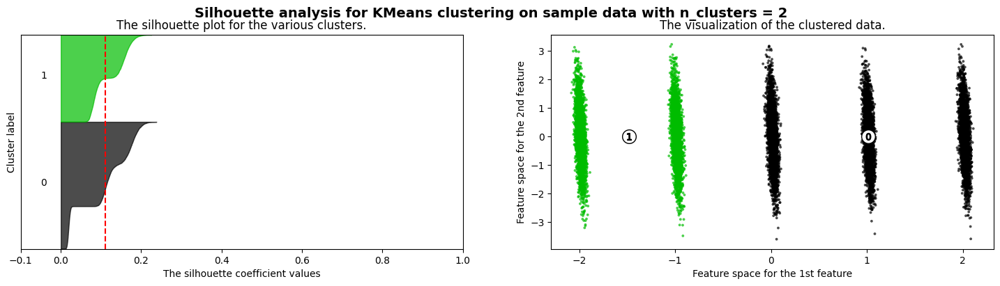

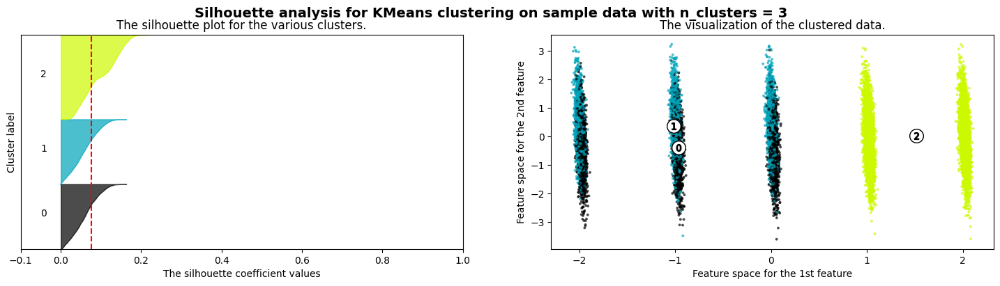

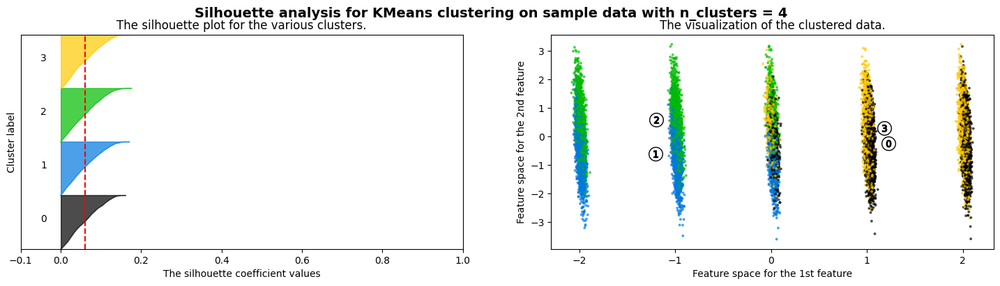

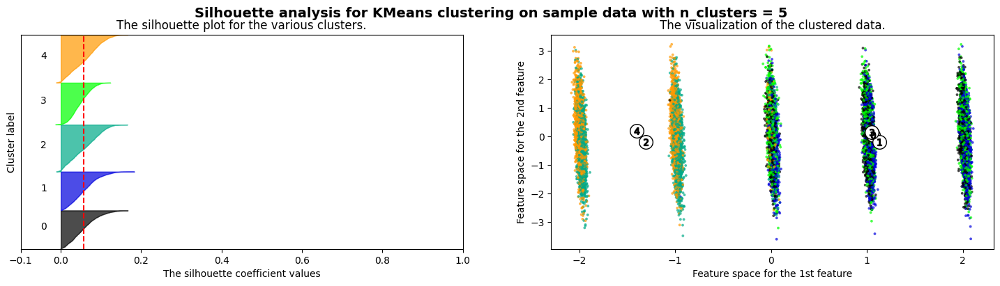

In [13]:
# Display the Silhouette Score and Plot Silhouette Plot

plot_silhouette(range(2, 6), data_scaled_pca, 3)

In [14]:
km = KMeans(n_clusters = 4, random_state = 3)
km.fit(data_scaled_pca)

KMeans(n_clusters=4, random_state=3)

In [15]:
pred = km.predict(data_scaled_pca)
pred

array([3, 2, 0, ..., 3, 1, 0])

In [16]:
# Insert clustering result into original dataset

data1['cluster'] = pred
data1

,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,cluster
0,IT,Male,37,Technician,2023-08-28 08:03:05.556036,1,Bachelor,5,5250.0,55,20,29,2,0,16,27,0,4.46,3
1,Marketing,Female,55,Technician,2023-06-29 08:03:05.556036,1,High School,2,4200.0,51,23,21,14,0,1,0,1,1.44,2
2,Customer Support,Male,27,Technician,2015-02-19 08:03:05.556036,9,Bachelor,5,5250.0,39,13,2,13,25,5,88,0,1.96,0
3,HR,Male,51,Technician,2019-07-04 08:03:05.556036,5,Bachelor,4,4900.0,31,11,16,1,75,7,17,2,2.13,3
4,Finance,Male,23,Technician,2015-05-08 08:03:05.556036,9,High School,2,4200.0,52,0,9,1,0,5,66,0,3.91,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12851,HR,Female,51,Technician,2020-03-18 08:03:05.556036,4,Master,3,4550.0,40,14,1,12,100,10,61,0,4.73,1
12852,Legal,Female,41,Technician,2022-09-18 08:03:05.556036,1,Bachelor,5,5250.0,40,6,29,8,75,11,88,0,2.44,0
12853,Engineering,Female,28,Technician,2023-10-01 08:03:05.556036,0,Bachelor,4,4900.0,37,43,8,12,75,1,46,1,4.48,3
12854,Finance,Male,41,Technician,2023-12-15 08:03:05.556036,0,Bachelor,2,4200.0,43,12,17,10,75,13,37,2,3.05,1


<Axes: >

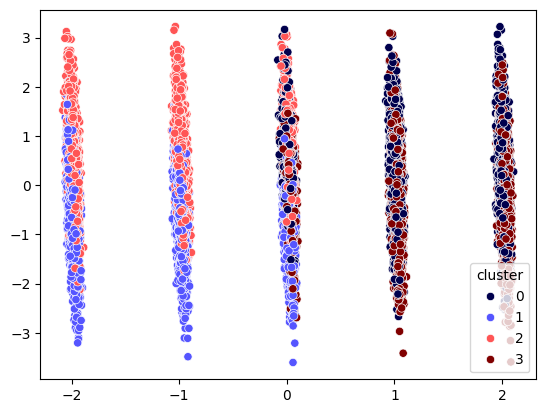

In [17]:
# Cluster visualization in 2D

pca_2d = PCA(n_components=2)
pca_2d.fit(data_scaled)

sales_scaled_pca_2d = pca_2d.fit_transform(data_scaled)

sns.scatterplot(x=sales_scaled_pca_2d[:,0], y=sales_scaled_pca_2d[:,1], hue=data1['cluster'], palette='seismic')